In [1]:
# Import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pygam import PoissonGAM, s,f, GAM, InvGaussGAM, te, l

# Load bike rental data with station information CSV file
bike_dat_raw = pd.read_csv("seoul_bike_rental_data_processed_2406.csv", encoding="cp949")

# Check the shape of processed data
bike_dat_raw.shape

(4984352, 29)

In [3]:
# Check irregular rides of 0 minutes used or 0 meters riden, Exclude them.
print((bike_dat_raw['use_meters']==0).value_counts())
print()
print((bike_dat_raw['use_minutes']==0).value_counts())

bike_dat = bike_dat_raw[(bike_dat_raw['use_meters']!=0) & (bike_dat_raw['use_minutes']!=0)].copy()
print()
print(bike_dat.shape)

False    4752525
True      231827
Name: use_meters, dtype: int64

False    4861062
True      123290
Name: use_minutes, dtype: int64

(4740293, 29)


In [5]:
# Add numeric forms of station IDs
station_id_num = np.concatenate([bike_dat['rent_station_id'].drop_duplicates(), bike_dat['return_station_id'].drop_duplicates()])
station_id_num = pd.Series(station_id_num).drop_duplicates().astype('category')
station_id_num = pd.DataFrame({'station_id': station_id_num, 'station_id_num': station_id_num.cat.codes})

bike_dat = bike_dat.merge(station_id_num.rename(columns={'station_id': 'rent_station_id', 'station_id_num': 'rent_station_id_num'}), how = 'left', on = 'rent_station_id')
bike_dat = bike_dat.merge(station_id_num.rename(columns={'station_id': 'return_station_id', 'station_id_num': 'return_station_id_num'}), how = 'left', on = 'return_station_id')

# Convert rent_is_weekend to numeric
bike_dat['rent_is_weekend'] = bike_dat['rent_is_weekend'].astype(int)
bike_dat['return_is_weekend'] = bike_dat['return_is_weekend'].astype(int)

In [131]:
# For each station, find operated dates and hours
rent_dates = bike_dat[['rent_station_id_num', 'rent_date']].drop_duplicates().rename(columns={'rent_station_id_num': 'station_id_num', 'rent_date': 'date'})
return_dates = bike_dat[['return_station_id_num', 'return_date']].drop_duplicates().rename(columns={'return_station_id_num': 'station_id_num', 'return_date': 'date'})
operated_dates = pd.concat([rent_dates, return_dates], axis=0).drop_duplicates()

hours = pd.DataFrame({"hour": np.arange(24)})
operated_hours = operated_dates.merge(hours, how="cross")

# Add station and date information
rent_station_info = bike_dat[['rent_station_id_num', 'rent_station_latitude', 'rent_station_longitude']].drop_duplicates().rename(
    columns={'rent_station_id_num': 'station_id_num', 'rent_station_latitude':'station_latitude', 'rent_station_longitude':'station_longitude'})
return_station_info = bike_dat[['return_station_id_num', 'return_station_latitude', 'return_station_longitude']].drop_duplicates().rename(
    columns={'return_station_id_num': 'station_id_num', 'return_station_latitude':'station_latitude', 'return_station_longitude':'station_longitude'})
station_info = pd.concat([rent_station_info, return_station_info], axis=0).drop_duplicates()

rent_date_info = bike_dat[['rent_date', 'rent_is_weekend', 'rent_weekday']].drop_duplicates().rename(
    columns={'rent_date': 'date', 'rent_is_weekend':'is_weekend', 'rent_weekday':'weekday'})
return_date_info = bike_dat[['return_date', 'return_is_weekend', 'return_weekday']].drop_duplicates().rename(
    columns={'return_date': 'date', 'return_is_weekend':'is_weekend', 'return_weekday':'weekday'})
date_info = pd.concat([rent_date_info, return_date_info], axis=0).drop_duplicates()

operated_hours = operated_hours.merge(station_info, how="left", on ='station_id_num')
operated_hours = operated_hours.merge(date_info, how="left", on ='date')

operated_hours

,station_id_num,date,hour,station_latitude,station_longitude,is_weekend,weekday
0,630,2024-06-01,0,37.565201,126.827316,1,5
1,630,2024-06-01,1,37.565201,126.827316,1,5
2,630,2024-06-01,2,37.565201,126.827316,1,5
3,630,2024-06-01,3,37.565201,126.827316,1,5
4,630,2024-06-01,4,37.565201,126.827316,1,5
...,...,...,...,...,...,...,...
1974811,355,2024-07-01,19,37.477467,127.141510,0,0
1974812,355,2024-07-01,20,37.477467,127.141510,0,0
1974813,355,2024-07-01,21,37.477467,127.141510,0,0
1974814,355,2024-07-01,22,37.477467,127.141510,0,0


In [133]:
# Add hourly bike rent and return counts
hourly_rent_counts = bike_dat.groupby(
    ['rent_station_id_num', 'rent_date', 'rent_hour'], as_index=False).size().rename(
    columns={'rent_station_id_num': 'station_id_num', 'rent_date': 'date', 'rent_hour':'hour', 'size': 'num_rent'})
hourly_return_counts = bike_dat.groupby(
    ['return_station_id_num', 'return_date', 'return_hour'], as_index=False).size().rename(
    columns={'return_station_id_num': 'station_id_num', 'return_date': 'date', 'return_hour':'hour', 'size': 'num_return'})

operated_hours = operated_hours.merge(hourly_rent_counts, how='left', on = ['station_id_num', 'date', 'hour']).fillna(0)
operated_hours = operated_hours.merge(hourly_return_counts, how='left', on = ['station_id_num', 'date', 'hour']).fillna(0)

operated_hours = operated_hours.sort_values(['station_id_num', 'date', 'hour'])
operated_hours = operated_hours[operated_hours['date'] != '2024-07-01']

# Add rolling average of bike rent and return counts for past 7 day-periods
operated_hours['num_rent_past_week'] = (
    operated_hours.groupby(['station_id_num', 'hour'])['num_rent']
    .transform(lambda x: x.rolling(7, min_periods=1).mean().shift(1)))

operated_hours['num_return_past_week'] = (
    operated_hours.groupby(['station_id_num', 'hour'])['num_return']
    .transform(lambda x: x.rolling(7, min_periods=1).mean().shift(1)))

operated_hours = operated_hours[pd.isna(operated_hours['num_return_past_week'])==False]

operated_hours

,station_id_num,date,hour,station_latitude,station_longitude,is_weekend,weekday,num_rent,num_return,num_rent_past_week,num_return_past_week
21552,0,2024-06-01,0,37.552746,126.918617,1,5,2.0,0.0,NaN,NaN
21553,0,2024-06-01,1,37.552746,126.918617,1,5,1.0,1.0,NaN,NaN
21554,0,2024-06-01,2,37.552746,126.918617,1,5,0.0,0.0,NaN,NaN
21555,0,2024-06-01,3,37.552746,126.918617,1,5,0.0,0.0,NaN,NaN
21556,0,2024-06-01,4,37.552746,126.918617,1,5,2.0,3.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1902235,2739,2024-06-30,19,37.534390,126.869598,1,6,13.0,19.0,10.714286,17.714286
1902236,2739,2024-06-30,20,37.534390,126.869598,1,6,4.0,13.0,7.714286,15.000000
1902237,2739,2024-06-30,21,37.534390,126.869598,1,6,5.0,19.0,8.285714,16.285714
1902238,2739,2024-06-30,22,37.534390,126.869598,1,6,8.0,18.0,5.714286,18.857143


In [137]:
# train models with first three weeks of data, test on the last week of data 
operated_hours_train = operated_hours[operated_hours['date'] < '2024-06-24'].copy()
operated_hours_test = operated_hours[operated_hours['date'] >= '2024-06-24'].copy()

In [143]:
# GAM with Poisson distribution of response variables, hourly bike rentals
# interactions between latitudes and longitudes of stations
# factor term of weekends or not
# smoothing terms of hours and 7-day rolling averages of bike rentals
gam_rent = PoissonGAM(te(0,1) + s(2) + s(3) + s(3, by=2) + s(4))
gam_rent.fit(operated_hours_train[['station_latitude', 'station_longitude', 'weekday', 'hour', 'num_rent_past_week']], operated_hours_train['num_rent'])

gam_rent.summary()

PoissonGAM                                                                                                
=============================================== ==========================================================
Distribution:                       PoissonDist Effective DoF:                                    119.2829
Link Function:                          LogLink Log Likelihood:                              -2429948.3045
Number of Samples:                      1432920 AIC:                                          4860135.1746
                                                AICc:                                          4860135.195
                                                UBRE:                                               3.5925
                                                Scale:                                                 1.0
                                                Pseudo R-Squared:                                   0.6385
Feature Function                  Lam

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26672\1535043789.py:8: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  gam_rent.summary()


In [145]:
# GAM with Poisson distribution of response variables, hourly bike return
# interactions between latitudes and longitudes of stations
# factor term of weekends or not
# smoothing terms of hours and 7-day rolling averages of bike return
gam_return = PoissonGAM(te(0,1) + s(2) + s(3) + s(3, by=2) + s(4))
gam_return.fit(operated_hours_train[['station_latitude', 'station_longitude', 'weekday', 'hour', 'num_return_past_week']], operated_hours_train['num_return'])

gam_return.summary()

PoissonGAM                                                                                                
=============================================== ==========================================================
Distribution:                       PoissonDist Effective DoF:                                    118.3198
Link Function:                          LogLink Log Likelihood:                              -2331816.5365
Number of Samples:                      1432920 AIC:                                          4663869.7125
                                                AICc:                                         4663869.7326
                                                UBRE:                                                3.475
                                                Scale:                                                 1.0
                                                Pseudo R-Squared:                                   0.6715
Feature Function                  Lam

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_26672\4045115806.py:8: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  gam_return.summary()


In [147]:
# Make predictions on the test set
operated_hours_test['rent_pred'] = gam_rent.predict(operated_hours_test[['station_latitude', 'station_longitude', 'weekday', 'hour', 'num_rent_past_week']])
operated_hours_test['return_pred'] = gam_rent.predict(operated_hours_test[['station_latitude', 'station_longitude', 'weekday', 'hour', 'num_return_past_week']])

operated_hours_test['rent_resd'] = operated_hours_test['num_rent'] - operated_hours_test['rent_pred']
operated_hours_test['return_resd'] = operated_hours_test['num_return'] - operated_hours_test['return_pred']

operated_hours_test['diff'] = operated_hours_test['num_return'] - operated_hours_test['num_rent']
operated_hours_test['diff_pred'] = operated_hours_test['return_pred'] - operated_hours_test['rent_pred']

operated_hours_test

,station_id_num,date,hour,station_latitude,station_longitude,is_weekend,weekday,num_rent,num_return,num_rent_past_week,num_return_past_week,rent_pred,return_pred
1501944,0,2024-06-24,0,37.552746,126.918617,0,0,3.0,0.0,1.571429,1.428571,1.161113,1.072417
1501945,0,2024-06-24,1,37.552746,126.918617,0,0,7.0,1.0,1.571429,1.857143,0.963218,1.118179
1501946,0,2024-06-24,2,37.552746,126.918617,0,0,2.0,0.0,1.000000,1.285714,0.551806,0.658032
1501947,0,2024-06-24,3,37.552746,126.918617,0,0,0.0,0.0,0.571429,0.285714,0.339029,0.273893
1501948,0,2024-06-24,4,37.552746,126.918617,0,0,0.0,0.0,0.571429,0.285714,0.423626,0.342237
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1902235,2739,2024-06-30,19,37.534390,126.869598,1,6,13.0,19.0,10.714286,17.714286,8.341432,14.300911
1902236,2739,2024-06-30,20,37.534390,126.869598,1,6,4.0,13.0,7.714286,15.000000,6.640538,13.272101
1902237,2739,2024-06-30,21,37.534390,126.869598,1,6,5.0,19.0,8.285714,16.285714,6.575093,13.498396
1902238,2739,2024-06-30,22,37.534390,126.869598,1,6,8.0,18.0,5.714286,18.857143,4.653366,13.486132


In [151]:
operated_hours_test['diff'] = operated_hours_test['num_return'] - operated_hours_test['num_rent']
operated_hours_test['diff_pred'] = operated_hours_test['return_pred'] - operated_hours_test['rent_pred']

operated_hours_test

,station_id_num,date,hour,station_latitude,station_longitude,is_weekend,weekday,num_rent,num_return,num_rent_past_week,num_return_past_week,rent_pred,return_pred,rent_resd,return_resd,diff,diff_pred
1501944,0,2024-06-24,0,37.552746,126.918617,0,0,3.0,0.0,1.571429,1.428571,1.161113,1.072417,1.838887,-1.072417,-3.0,-0.088697
1501945,0,2024-06-24,1,37.552746,126.918617,0,0,7.0,1.0,1.571429,1.857143,0.963218,1.118179,6.036782,-0.118179,-6.0,0.154961
1501946,0,2024-06-24,2,37.552746,126.918617,0,0,2.0,0.0,1.000000,1.285714,0.551806,0.658032,1.448194,-0.658032,-2.0,0.106226
1501947,0,2024-06-24,3,37.552746,126.918617,0,0,0.0,0.0,0.571429,0.285714,0.339029,0.273893,-0.339029,-0.273893,0.0,-0.065136
1501948,0,2024-06-24,4,37.552746,126.918617,0,0,0.0,0.0,0.571429,0.285714,0.423626,0.342237,-0.423626,-0.342237,0.0,-0.081389
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1902235,2739,2024-06-30,19,37.534390,126.869598,1,6,13.0,19.0,10.714286,17.714286,8.341432,14.300911,4.658568,4.699089,6.0,5.959479
1902236,2739,2024-06-30,20,37.534390,126.869598,1,6,4.0,13.0,7.714286,15.000000,6.640538,13.272101,-2.640538,-0.272101,9.0,6.631562
1902237,2739,2024-06-30,21,37.534390,126.869598,1,6,5.0,19.0,8.285714,16.285714,6.575093,13.498396,-1.575093,5.501604,14.0,6.923303
1902238,2739,2024-06-30,22,37.534390,126.869598,1,6,8.0,18.0,5.714286,18.857143,4.653366,13.486132,3.346634,4.513868,10.0,8.832766


In [193]:
operated_hours_test['hour_from_6'] = operated_hours_test['hour'].apply(lambda x: x if x >= 6 else x + 24)
operated_hours_test['date'] = pd.to_datetime(operated_hours_test['date'])
operated_hours_test['date_converted'] = operated_hours_test.apply(lambda x: x['date'] - pd.Timedelta(days=1) if x['hour_from_6'] >= 24 else x['date'], axis=1)
operated_hours_test = operated_hours_test.sort_values(by='hour_from_6')

operated_hours_test['diff_cumsum'] = operated_hours_test.groupby(['station_id_num', 'date_converted'])['diff'].cumsum()
operated_hours_test['diff_pred_cumsum'] = operated_hours_test.groupby(['station_id_num', 'date_converted'])['diff_pred'].cumsum()

operated_hours_test

,station_id_num,date,hour,station_latitude,station_longitude,is_weekend,weekday,num_rent,num_return,num_rent_past_week,...,rent_pred,return_pred,rent_resd,return_resd,diff,diff_pred,hour_from_6,date_converted,diff_cumsum,diff_pred_cumsum
1933518,1078,2024-06-30,6,37.602425,127.019981,1,6,0.0,0.0,1.571429,...,0.641735,0.276206,-0.641735,-0.276206,0.0,-0.365530,6,2024-06-30,0.0,-0.365530
1763886,2199,2024-06-28,6,37.570354,127.048431,0,4,1.0,2.0,2.571429,...,2.275973,1.210530,-1.275973,0.789470,1.0,-1.065443,6,2024-06-28,1.0,-1.065443
1619790,2028,2024-06-25,6,37.434746,127.065948,0,1,0.0,0.0,0.000000,...,0.309634,0.309634,-0.309634,-0.309634,0.0,0.000000,6,2024-06-25,0.0,0.000000
1543134,700,2024-06-24,6,37.501667,127.137741,0,0,3.0,1.0,2.142857,...,3.058756,2.122608,-0.058756,-1.122608,-2.0,-0.936148,6,2024-06-24,-2.0,-0.936148
1684974,374,2024-06-26,6,37.549889,127.007347,0,2,1.0,0.0,0.285714,...,0.672638,0.534748,0.327362,-0.534748,-1.0,-0.137890,6,2024-06-26,-1.0,-0.137890
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1623557,1325,2024-06-25,5,37.562534,126.972496,0,1,0.0,0.0,0.000000,...,0.422750,0.422750,-0.422750,-0.422750,0.0,0.000000,29,2024-06-24,0.0,0.011430
1747901,787,2024-06-27,5,37.496895,127.070137,0,3,1.0,1.0,0.571429,...,0.521546,0.376453,0.478454,0.623547,0.0,-0.145093,29,2024-06-26,6.0,-3.464230
1560053,1325,2024-06-24,5,37.562534,126.972496,0,0,0.0,0.0,0.000000,...,0.451336,0.451336,-0.451336,-0.451336,0.0,0.000000,29,2024-06-23,0.0,0.044003
1894949,224,2024-06-30,5,37.476482,126.965363,1,6,0.0,0.0,0.142857,...,0.221558,0.221558,-0.221558,-0.221558,0.0,0.000000,29,2024-06-29,-6.0,-2.417335


In [201]:
# folium map visualizationsall
import requests
import json
import folium
import branca.colormap as cm

r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
    
c = r.content
seoul_geo = json.loads(c)

In [227]:
# Visualize predictions and actual values for 06/28/2024 6 PM
operated_hours_map = operated_hours_test[(operated_hours_test['hour']==20) & (operated_hours_test['date']=='2024-06-27')]

range_min = min(operated_hours_map['diff_cumsum'].min(), operated_hours_map['diff_pred_cumsum'].min())
range_max = max(operated_hours_map['diff_cumsum'].max(), operated_hours_map['diff_pred_cumsum'].max())

range_diff = np.concatenate((operated_hours_map['diff_cumsum'], operated_hours_map['diff_pred_cumsum']))

In [229]:
# 16. folium map - predictions

colormap = cm.LinearColormap(
    colors=['blue', 'purple', 'white', 'yellow', 'orange', 'red'],
    vmin=range_min,
    vmax=range_max, 
    index= np.quantile(range_diff, q =[i / 5 for i in range(0, 6)])
)


m = folium.Map(
    location=[37.55708, 126.9902],     
    zoom_start=12, 
    scrollWheelZoom=False,
    fill_opacity=0,
    tiles='cartodbpositron',      
)

folium.GeoJson(seoul_geo, name='지역구', fillOpacity= 0, weight = 0.6).add_to(m)

for idx, geo_df_row in operated_hours_map.iterrows() :
    folium.Circle(radius=5, location=[geo_df_row['station_latitude'], geo_df_row['station_longitude']], color=colormap(geo_df_row['diff_pred_cumsum'])).add_to(m)
    
colormap.caption = 'Predicted Bike Returns'

m.add_child(colormap)

m

In [231]:
# 16. folium map - predictions

colormap = cm.LinearColormap(
    colors=['blue', 'purple', 'white', 'yellow', 'orange', 'red'],
    vmin=range_min,
    vmax=range_max, 
    index= np.quantile(range_diff, q =[i / 5 for i in range(0, 6)])
)


m = folium.Map(
    location=[37.55708, 126.9902],     
    zoom_start=12, 
    scrollWheelZoom=False,
    fill_opacity=0,
    tiles='cartodbpositron',      
)

folium.GeoJson(seoul_geo, name='지역구', fillOpacity= 0, weight = 0.6).add_to(m)

for idx, geo_df_row in operated_hours_map.iterrows() :
    folium.Circle(radius=5, location=[geo_df_row['station_latitude'], geo_df_row['station_longitude']], color=colormap(geo_df_row['diff_cumsum'])).add_to(m)
    
colormap.caption = 'Predicted Bike Returns'

m.add_child(colormap)

m

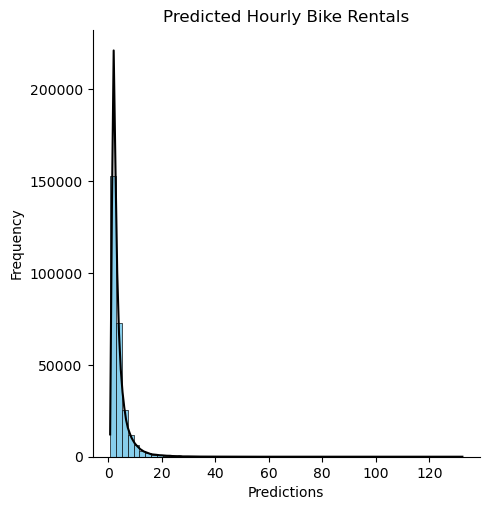

In [17]:
# 10. Distribution of predicted hourly bike rentals for the last week of June 2024

sns.displot(hourly_rent_counts_test['rent_pred'], kde=True, bins = 60, color="black", facecolor='skyblue')

plt.title("Predicted Hourly Bike Rentals")
plt.xlabel("Predictions")
plt.ylabel("Frequency")

plt.savefig('images/10_distribution_predicted_hourly_bike_rentals.png', bbox_inches='tight')
plt.show()

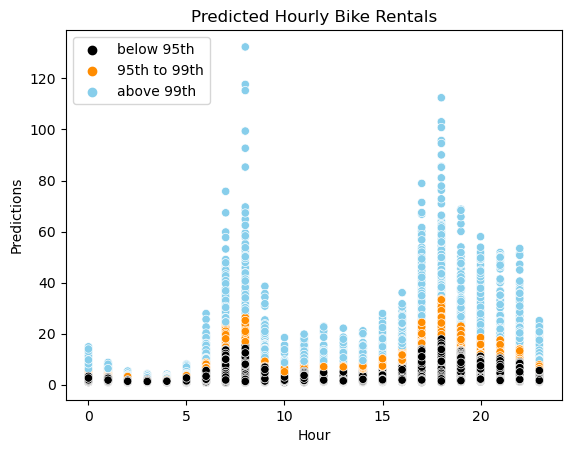

In [18]:
# 11. Predicted hourly bike rentals for the last week of June 2024

hourly_rent_counts_test['quantile_95'] = hourly_rent_counts_test['hour'].map(hourly_rent_counts_test.groupby(['hour'])['rent_pred'].quantile(0.95))
hourly_rent_counts_test['quantile_99'] = hourly_rent_counts_test['hour'].map(hourly_rent_counts_test.groupby(['hour'])['rent_pred'].quantile(0.99))

# Define a custom function to assign quantile groups
def assign_quantile_group(row):
    if row['rent_pred'] <= row['quantile_95']:
        return 'below 95th'
    elif row['rent_pred'] <= row['quantile_99']:
        return '95th to 99th'
    else:
        return 'above 99th'

hourly_rent_counts_test['quantile_range'] = hourly_rent_counts_test.apply(assign_quantile_group, axis=1)

sns.scatterplot(data=hourly_rent_counts_test, x='hour', y='rent_pred', hue='quantile_range', palette={'below 95th': 'black', '95th to 99th': 'darkorange', 'above 99th': 'skyblue'})

plt.title("Predicted Hourly Bike Rentals")
plt.xlabel("Hour")
plt.ylabel("Predictions")
plt.legend(loc='upper left')

plt.savefig('images/11_predicted_hourly_bike_rentals.png', bbox_inches='tight')
plt.show()

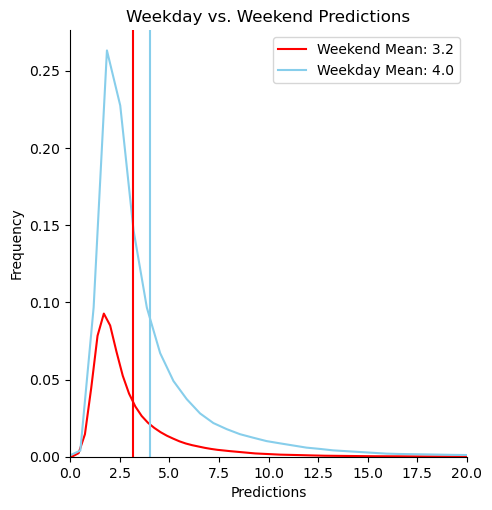

In [20]:
# 12. Weekday vs. Weekend predicted hourly bike rental

weekend_mean = hourly_rent_counts_test[hourly_rent_counts_test['rent_is_weekend'] == 1]['rent_pred'].mean()
weekday_mean = hourly_rent_counts_test[hourly_rent_counts_test['rent_is_weekend'] == 0]['rent_pred'].mean()

sns.displot(data=hourly_rent_counts_test, x="rent_pred", hue="rent_is_weekend", kind="kde", palette={1: 'red', 0: 'skyblue'}, legend=False)

plt.xlim(0,20)
plt.axvline(weekend_mean, color='red',  label=f'Weekend Mean: {weekend_mean:.1f}')
plt.axvline(weekday_mean, color='skyblue',  label=f'Weekday Mean: {weekday_mean:.1f}')

plt.title("Weekday vs. Weekend Predictions")
plt.xlabel("Predictions")
plt.ylabel("Frequency")
plt.legend(loc='upper right')

plt.savefig('images/12_weekday_vs_weekend_predictions.png', bbox_inches='tight')
plt.show()

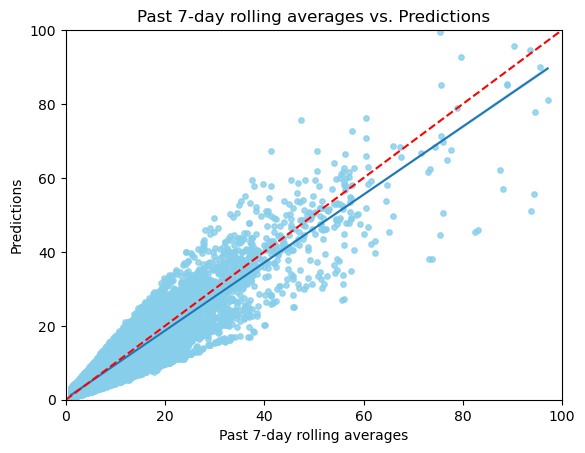

In [28]:
# 13. Past 7-day averages vs. Predictions

sns.regplot(data=hourly_rent_counts_test, x='num_rent_rolling_7', y='rent_pred', color='skyblue', line_kws={'color': None, 'linewidth': 1.5}, scatter_kws={'s':15})
plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=1.5)

plt.title("Past 7-day rolling averages vs. Predictions")
plt.xlabel("Past 7-day rolling averages")
plt.ylabel("Predictions")
plt.xlim(0,100)
plt.ylim(0,100)

plt.savefig('images/13_rolling_averages_vs_predictions.png', bbox_inches='tight')
plt.show()

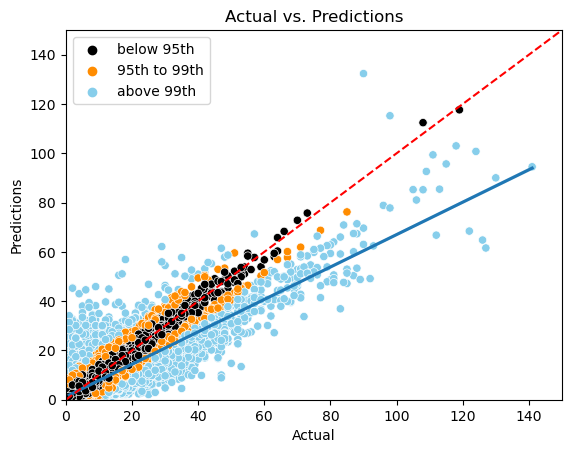

In [24]:
# 14. Actual hourly bike rentals vs. Predictions

hourly_rent_counts_test['abs_residual'] = abs(hourly_rent_counts_test['residual'])
hourly_rent_counts_test['abs_residual_quantile_95'] = hourly_rent_counts_test['abs_residual'].quantile(0.95)
hourly_rent_counts_test['abs_residual_quantile_99'] = hourly_rent_counts_test['abs_residual'].quantile(0.99)

def assign_quantile_group(row):
    if row['abs_residual'] <= row['abs_residual_quantile_95']:
        return 'below 95th'
    elif row['abs_residual'] <= row['abs_residual_quantile_99']:
        return '95th to 99th'
    else:
        return 'above 99th'

hourly_rent_counts_test['abs_residual_quantile_range'] = hourly_rent_counts_test.apply(assign_quantile_group, axis=1)


sns.scatterplot(data=hourly_rent_counts_test, x='num_rent', y='rent_pred', hue='abs_residual_quantile_range', palette={'below 95th': 'black', '95th to 99th': 'darkorange', 'above 99th': 'skyblue'})
sns.regplot(data=hourly_rent_counts_test, x='num_rent', y='rent_pred', scatter=False)

plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=1.5)

plt.xlim(0,150)
plt.ylim(0,150)
plt.title("Actual vs. Predictions")
plt.xlabel("Actual")
plt.ylabel("Predictions")
plt.legend(loc='upper left')

plt.savefig('images/14_actual_vs_predictions.png', bbox_inches='tight')
plt.show()

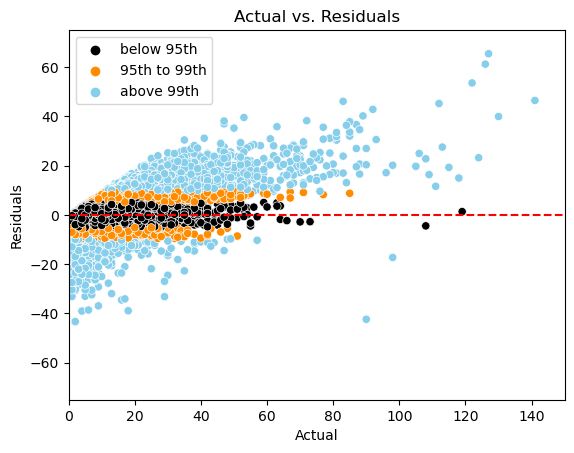

In [26]:
# 15. Actual hourly bike rentals vs. Residuals

sns.scatterplot(data=hourly_rent_counts_test, x='num_rent', y='residual', hue='abs_residual_quantile_range', palette={'below 95th': 'black', '95th to 99th': 'darkorange', 'above 99th': 'skyblue'})

plt.axline((0, 0), slope=0, color='red', linestyle='--', linewidth=1.5)


plt.xlim(0,150)
plt.ylim(-75,75)
plt.title("Actual vs. Residuals")
plt.xlabel("Actual")
plt.ylabel("Residuals")
plt.legend(loc='upper left')

plt.savefig('images/15_actual_vs_residuals.png', bbox_inches='tight')
plt.show()

In [81]:
# RMSE
hourly_rent_counts_high = hourly_rent_counts_test[hourly_rent_counts_test['num_rent'] > 40]

gam_rmse = np.mean((hourly_rent_counts_test['num_rent'] - hourly_rent_counts_test['rent_pred'])**2) ** 0.5
baseline_rmse = np.mean((hourly_rent_counts_test['num_rent'] - hourly_rent_counts_test['num_rent_rolling_7'])**2) ** 0.5

gam_rmse_high = np.mean((hourly_rent_counts_high['num_rent'] - hourly_rent_counts_high['rent_pred'])**2) ** 0.5
baseline_rmse_high = np.mean((hourly_rent_counts_high['num_rent'] - hourly_rent_counts_high['num_rent_rolling_7'])**2) ** 0.5

print(f'GAM RMSE (All Data): {gam_rmse:.2f}')
print(f'Baseline RMSE (All Data): {baseline_rmse:.2f}')

print(f'GAM RMSE (Data > 40): {gam_rmse_high:.2f}')
print(f'Baseline RMSE (Data > 40): {baseline_rmse_high:.2f}')

GAM RMSE (All Data): 2.59
Baseline RMSE (All Data): 2.83
GAM RMSE (Data > 40): 18.35
Baseline RMSE (Data > 40): 18.78


In [87]:
# Correlations with actual data
hourly_rent_counts_high = hourly_rent_counts_test[hourly_rent_counts_test['num_rent'] > 40]

gam_corr = hourly_rent_counts_test['num_rent'].corr(hourly_rent_counts_test['rent_pred'])
baseline_corr = hourly_rent_counts_test['num_rent'].corr(hourly_rent_counts_test['num_rent_rolling_7'])

gam_corr_high = hourly_rent_counts_high['num_rent'].corr(hourly_rent_counts_high['rent_pred'])
baseline_corr_high = hourly_rent_counts_high['num_rent'].corr(hourly_rent_counts_high['num_rent_rolling_7'])

print(f'GAM Corr. (All Data): {gam_corr:.3f}')
print(f'Baseline Corr. (All Data): {baseline_corr:.3f}')

print(f'GAM Corr. (Data > 40): {gam_corr_high:.3f}')
print(f'Baseline Corr. (Data > 40): {baseline_corr_high:.3f}')


GAM Corr. (All Data): 0.838
Baseline Corr. (All Data): 0.800
GAM Corr. (Data > 40): 0.785
Baseline Corr. (Data > 40): 0.808


In [37]:
# folium map visualizationsall
import requests
import json
import folium
import branca.colormap as cm

r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
    
c = r.content
seoul_geo = json.loads(c)

In [43]:
# Visualize predictions and actual values for 06/28/2024 6 PM
hourly_rent_counts_18 = hourly_rent_counts_test[(hourly_rent_counts_test['hour']==18) & (hourly_rent_counts_test['rent_date']=='2024-06-28')]

range_min = min(hourly_rent_counts_18['num_rent'].min(), hourly_rent_counts_18['rent_pred'].min())
range_max = max(hourly_rent_counts_18['num_rent'].max(), hourly_rent_counts_18['rent_pred'].max())

range_rent = np.concatenate((hourly_rent_counts_18['num_rent'], hourly_rent_counts_18['rent_pred']))

In [159]:
# 16. folium map - predictions

colormap = cm.LinearColormap(
    colors=['blue', 'purple', 'white', 'yellow', 'orange', 'red'],
    vmin=range_min,
    vmax=range_max, 
    index= np.quantile(range_rent, q =[i / 5 for i in range(0, 6)])
)


m = folium.Map(
    location=[37.55708, 126.9902],     
    zoom_start=12, 
    scrollWheelZoom=False,
    fill_opacity=0,
    tiles='cartodbpositron',      
)

folium.GeoJson(seoul_geo, name='지역구', fillOpacity= 0, weight = 0.6).add_to(m)

for idx, geo_df_row in hourly_rent_counts_18.iterrows() :
    folium.Circle(radius=5, location=[geo_df_row['latitude'], geo_df_row['longitude']], color=colormap(geo_df_row['rent_pred'])).add_to(m)
    
colormap.caption = 'Predicted Bike Rentals'

m.add_child(colormap)

m

In [161]:
# 17. folium map - predictions

m = folium.Map(
    location=[37.55708, 126.9902],     
    zoom_start=12, 
    scrollWheelZoom=False,
    fill_opacity=0,
    tiles='cartodbpositron',      
)

folium.GeoJson(seoul_geo, name='지역구', fillOpacity= 0, weight = 0.6).add_to(m)

for idx, geo_df_row in hourly_rent_counts_18.iterrows() :
    folium.Circle(radius=5, location=[geo_df_row['latitude'], geo_df_row['longitude']], color=colormap(geo_df_row['num_rent'])).add_to(m)

colormap.caption = 'Actual Bike Rentals'

m.add_child(colormap)

m

In [25]:
# Calculate hourly bike returns for each station 
hourly_return_counts = bike_dat.groupby(['return_station_id_num', 'return_station_latitude', 'return_station_longitude', 'return_date', 'return_is_weekend', 'return_weekday', 'return_hour'], as_index=False).size().rename(columns={'size': 'num_return'})

# Add past 7-day rolling averages of hourly bike returns for each station
daily_return_counts = hourly_return_counts.groupby(['return_station_id_num', 'return_is_weekend', 'return_date', 'return_hour'])['num_return'].sum().reset_index()
daily_return_counts = daily_return_counts.sort_values(['return_station_id_num', 'return_date'])
daily_return_counts['num_return_rolling_7'] = (
    daily_return_counts.groupby(['return_station_id_num', 'return_hour'])['num_return']
    .transform(lambda x: x.rolling(7, min_periods=1).mean().shift(1)))

hourly_return_counts = hourly_return_counts.merge(
    daily_return_counts[['return_station_id_num', 'return_date', 'return_hour', 'num_return_rolling_7']],
    how='left',
    on=['return_station_id_num','return_date', 'return_hour'])

hourly_return_counts = hourly_return_counts[hourly_return_counts['num_return_rolling_7'].isnull()==False]

In [27]:
# Train model with first three-week data, validate it on the last week data
hourly_return_counts_train = hourly_return_counts[hourly_return_counts['return_date'] < '2024-06-24'].copy()
hourly_return_counts_test = hourly_return_counts[hourly_return_counts['return_date'] >= '2024-06-24'].copy()

#display(hourly_return_counts_train[(hourly_return_counts_train['return_station_id_num']==2739) & (hourly_return_counts_train['return_hour']==16)])
display(hourly_return_counts_train)
display(hourly_return_counts_test)

,return_station_id_num,return_station_latitude,return_station_longitude,return_date,return_is_weekend,return_weekday,return_hour,num_return,num_return_rolling_7
22,0,37.552746,126.918617,2024-06-02,1,6,1,1,1.000000
25,0,37.552746,126.918617,2024-06-02,1,6,5,1,2.000000
26,0,37.552746,126.918617,2024-06-02,1,6,6,2,1.000000
27,0,37.552746,126.918617,2024-06-02,1,6,7,1,2.000000
28,0,37.552746,126.918617,2024-06-02,1,6,8,1,1.000000
...,...,...,...,...,...,...,...,...,...
1199382,2739,37.534390,126.869598,2024-06-23,1,6,19,8,18.571429
1199383,2739,37.534390,126.869598,2024-06-23,1,6,20,7,18.571429
1199384,2739,37.534390,126.869598,2024-06-23,1,6,21,9,17.142857
1199385,2739,37.534390,126.869598,2024-06-23,1,6,22,3,20.714286


,return_station_id_num,return_station_latitude,return_station_longitude,return_date,return_is_weekend,return_weekday,return_hour,num_return,num_return_rolling_7
455,0,37.552746,126.918617,2024-06-24,0,0,1,1,3.000000
456,0,37.552746,126.918617,2024-06-24,0,0,6,1,1.142857
457,0,37.552746,126.918617,2024-06-24,0,0,7,4,2.142857
458,0,37.552746,126.918617,2024-06-24,0,0,8,4,4.857143
459,0,37.552746,126.918617,2024-06-24,0,0,9,8,4.857143
...,...,...,...,...,...,...,...,...,...
1199528,2739,37.534390,126.869598,2024-06-30,1,6,20,13,15.000000
1199529,2739,37.534390,126.869598,2024-06-30,1,6,21,19,17.857143
1199530,2739,37.534390,126.869598,2024-06-30,1,6,22,18,19.714286
1199531,2739,37.534390,126.869598,2024-06-30,1,6,23,11,7.142857


In [29]:
# GAM with Poisson distribution of response variables, hourly bike returns
# interactions between latitudes and longitudes of stations
# factor term of weekends or not
# smoothing terms of hours and 7-day rolling averages of bike returns

gam_return = PoissonGAM(te(0,1) + s(2) + s(3) + s(3, by=2) + s(4))
gam_return.fit(hourly_return_counts_train[['return_station_latitude', 'return_station_longitude', 'return_weekday', 'return_hour', 'num_return_rolling_7']], hourly_return_counts_train['num_return'])

gam_return.summary()

PoissonGAM                                                                                                
=============================================== ==========================================================
Distribution:                       PoissonDist Effective DoF:                                    117.8398
Link Function:                          LogLink Log Likelihood:                              -1729231.0325
Number of Samples:                       861668 AIC:                                          3458697.7445
                                                AICc:                                         3458697.7775
                                                UBRE:                                               3.1118
                                                Scale:                                                 1.0
                                                Pseudo R-Squared:                                   0.6812
Feature Function                  Lam

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_25736\3839834363.py:9: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  gam_return.summary()


In [31]:
# Make predictions on the test set
hourly_return_counts_test['return_pred'] = gam_return.predict(hourly_return_counts_test[['return_station_latitude', 'return_station_longitude', 'return_weekday', 'return_hour', 'num_return_rolling_7']])
hourly_return_counts_test['residual'] = hourly_return_counts_test['num_return'] - hourly_return_counts_test['return_pred']

hourly_return_counts_test = hourly_return_counts_test.rename(columns={'return_station_id_num': 'station_id_num', 'return_hour':'hour', 'return_station_latitude':'latitude', 'return_station_longitude':'longitude'})

hourly_return_counts_test

,station_id_num,latitude,longitude,return_date,return_is_weekend,return_weekday,hour,num_return,num_return_rolling_7,return_pred,residual
455,0,37.552746,126.918617,2024-06-24,0,0,1,1,3.000000,2.254523,-1.254523
456,0,37.552746,126.918617,2024-06-24,0,0,6,1,1.142857,2.079850,-1.079850
457,0,37.552746,126.918617,2024-06-24,0,0,7,4,2.142857,3.955240,0.044760
458,0,37.552746,126.918617,2024-06-24,0,0,8,4,4.857143,8.392674,-4.392674
459,0,37.552746,126.918617,2024-06-24,0,0,9,8,4.857143,5.765439,2.234561
...,...,...,...,...,...,...,...,...,...,...,...
1199528,2739,37.534390,126.869598,2024-06-30,1,6,20,13,15.000000,12.982655,0.017345
1199529,2739,37.534390,126.869598,2024-06-30,1,6,21,19,17.857143,15.113007,3.886993
1199530,2739,37.534390,126.869598,2024-06-30,1,6,22,18,19.714286,15.450989,2.549011
1199531,2739,37.534390,126.869598,2024-06-30,1,6,23,11,7.142857,6.208599,4.791401


In [33]:
# Visualize predictions and actual values for 06/28/2024 6 PM
hourly_return_counts_18 = hourly_return_counts_test[(hourly_return_counts_test['hour']==18) & (hourly_return_counts_test['return_date']=='2024-06-28')]

range_min = min(hourly_return_counts_18['num_return'].min(), hourly_return_counts_18['return_pred'].min())
range_max = max(hourly_return_counts_18['num_return'].max(), hourly_return_counts_18['return_pred'].max())

range_return = np.concatenate((hourly_return_counts_18['num_return'], hourly_return_counts_18['return_pred']))

In [39]:
# 16. folium map - predictions

colormap = cm.LinearColormap(
    colors=['blue', 'purple', 'white', 'yellow', 'orange', 'red'],
    vmin=range_min,
    vmax=range_max, 
    index= np.quantile(range_return, q =[i / 5 for i in range(0, 6)])
)


m = folium.Map(
    location=[37.55708, 126.9902],     
    zoom_start=12, 
    scrollWheelZoom=False,
    fill_opacity=0,
    tiles='cartodbpositron',      
)

folium.GeoJson(seoul_geo, name='지역구', fillOpacity= 0, weight = 0.6).add_to(m)

for idx, geo_df_row in hourly_return_counts_18.iterrows() :
    folium.Circle(radius=5, location=[geo_df_row['latitude'], geo_df_row['longitude']], color=colormap(geo_df_row['return_pred'])).add_to(m)
    
colormap.caption = 'Predicted Bike Returns'

m.add_child(colormap)

m

In [87]:
hourly_diff_18 = hourly_rent_counts_18.merge(hourly_return_counts_18[['station_id_num', 'return_pred']], how='left', on='station_id_num')
hourly_diff_18['diff'] = hourly_diff_18['return_pred'] - hourly_diff_18['rent_pred']
hourly_diff_18 = hourly_diff_18[hourly_diff_18['diff'].isna()==False]


range_diff_min = hourly_diff_18['diff'].min()
range_diff_max = hourly_diff_18['diff'].max()

range_diff = hourly_diff_18['diff']

hourly_diff_18

,station_id_num,latitude,longitude,rent_date,rent_is_weekend,rent_weekday,hour,num_rent,num_rent_rolling_7,rent_pred,residual,return_pred,diff
0,0,37.552746,126.918617,2024-06-28,0,4,18,7,8.571429,8.528911,-1.528911,5.313676,-3.215235
1,1,37.510380,126.866798,2024-06-28,0,4,18,9,6.142857,6.643269,2.356731,8.873274,2.230005
2,2,37.529900,126.876541,2024-06-28,0,4,18,16,23.000000,22.702939,-6.702939,15.861558,-6.841382
3,3,37.539551,126.828300,2024-06-28,0,4,18,10,3.428571,3.528760,6.471240,4.081919,0.553158
4,5,37.513950,126.856056,2024-06-28,0,4,18,12,10.285714,10.317893,1.682107,15.045152,4.727260
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2405,2734,37.549061,126.954178,2024-06-28,0,4,18,2,5.857143,5.549608,-3.549608,6.781934,1.232326
2406,2735,37.521511,126.857384,2024-06-28,0,4,18,6,4.571429,4.963932,1.036068,8.040686,3.076754
2407,2736,37.529163,126.872749,2024-06-28,0,4,18,21,17.428571,17.215151,3.784849,5.764165,-11.450986
2408,2737,37.510597,126.857323,2024-06-28,0,4,18,1,2.571429,3.140896,-2.140896,1.801507,-1.339389


In [89]:
# 16. folium map - differences

colormap = cm.LinearColormap(
    colors=['blue', 'purple', 'white', 'yellow', 'orange', 'red'],
    vmin=range_diff_min,
    vmax=range_diff_max, 
    index= np.quantile(sorted(range_diff), q =[i / 5 for i in range(0, 6)])
)


m = folium.Map(
    location=[37.55708, 126.9902],     
    zoom_start=12, 
    scrollWheelZoom=False,
    fill_opacity=0,
    tiles='cartodbpositron',      
)

folium.GeoJson(seoul_geo, name='지역구', fillOpacity= 0, weight = 0.6).add_to(m)

for idx, geo_df_row in hourly_diff_18.iterrows() :
    folium.Circle(radius=5, location=[geo_df_row['latitude'], geo_df_row['longitude']], color=colormap(geo_df_row['diff'])).add_to(m)
    
colormap.caption = 'Differences'

m.add_child(colormap)

m